# Module 15, Assignment 1

This assignment mixes **code** and **conceptual questions**.

**What you’ll do**
- Train a few models on a **heart disease** tabular dataset and compare interpretability tools.
- Load a real **Rio photo** and compute **Grad-CAM**.
- Use a pretrained **text** classifier and compute a **LIME-style text explanation**.


In [1]:
# Setup
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
import urllib.request
import os

# For the XGBoost part
import xgboost as xgb

np.random.seed(0)


## Heart Disease Dataset (Tabular)

In this section, we use a classic **heart disease** dataset collected from patients who underwent clinical evaluation and angiographic assessment. Each row corresponds to **one patient**, and the task is to predict whether the patient has clinically significant coronary artery disease.

---

### Prediction Target

- **`num` (target)**: diagnosis of heart disease based on angiographic disease status  
  - `0`: **< 50%** diameter narrowing in any major coronary vessel  
  - `1`: **≥ 50%** diameter narrowing in at least one major vessel  

We treat this as a **binary classification** problem:  
**heart disease (1)** vs **no heart disease (0)**.

---

### Features Used in This Assignment (14 total)

We focus on a standard subset of clinically meaningful variables that are commonly used in tutorials and benchmarks:

- **`age`**: age in years  
- **`sex`**: sex (`1` = male, `0` = female)  
- **`cp`**: chest pain type  
  - `1`: typical angina  
  - `2`: atypical angina  
  - `3`: non-anginal pain  
  - `4`: asymptomatic  
- **`trestbps`**: resting blood pressure (mm Hg, measured at hospital admission)  
- **`chol`**: serum cholesterol (mg/dl)  
- **`fbs`**: fasting blood sugar > 120 mg/dl (`1` = true, `0` = false)  
- **`restecg`**: resting electrocardiographic results  
  - `0`: normal  
  - `1`: ST–T wave abnormality  
  - `2`: probable or definite left ventricular hypertrophy  
- **`thalach`**: maximum heart rate achieved during exercise  
- **`exang`**: exercise-induced angina (`1` = yes, `0` = no)  
- **`oldpeak`**: ST depression induced by exercise relative to rest  
- **`slope`**: slope of the peak exercise ST segment  
  - `1`: upsloping  
  - `2`: flat  
  - `3`: downsloping  
- **`ca`**: number of major vessels (0–3) colored by fluoroscopy  
- **`thal`**: thalassemia test result  
  - `3`: normal  
  - `6`: fixed defect  
  - `7`: reversible defect  

---

### Notes on Excluded Identifiers and Sensitive Fields

The original dataset includes identifiers such as patient ID, social security number, and patient name. These variables are **not medically meaningful predictors** and are **not used** in this assignment. In some versions of the dataset, such fields may be replaced with dummy values for privacy.

---

### Why This Dataset Is Well-Suited for Explainability

Many of the features have clear clinical interpretations (e.g., chest pain type, exercise-induced angina, ST depression). This makes the dataset well suited for comparing different explainability approaches, including:

- **Logistic regression coefficients** (global, linear explanations)  
- **Decision tree rules** (threshold-based decisions)  
- **Random forest feature importance** (global rankings)  
- **XGBoost SHAP-style contributions** (local explanations for individual patients)  

Throughout this assignment, we will use these models and explanations to reason about **what the models learn**, **how they differ**, and **what conclusions can and cannot be drawn from interpretability tools**.


We first load the data.

In [4]:
# Load the dataset (local CSV included with this notebook folder)
# File: heart.csv  (from a UCI heart disease variant)
df = pd.read_csv("heart.csv")
df.head()


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


### Preparing features and train/test splits

In this step, we separate the outcome variable (`target`) from the input features and decide how different types of features should be treated by the model. Some variables represent categorical clinical information (e.g., encoded diagnoses or test results), while others are numeric measurements.

We also split the dataset into training and test sets, preserving the class balance using stratification. This ensures that model fitting and evaluation are performed on disjoint data, which is essential for assessing generalization performance.


In [5]:
# Split features/target
y = df["target"].astype(int)
X = df.drop(columns=["target"])

# Choose which columns to treat as categorical vs numeric
categorical = ["sex", "cp", "fbs", "restecg", "exang", "slope", "ca", "thal"]
numeric = [c for c in X.columns if c not in categorical]

print("Categorical:", categorical)
print("Numeric    :", numeric)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=0, stratify=y
)

X_train.shape, X_test.shape


Categorical: ['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'ca', 'thal']
Numeric    : ['age', 'trestbps', 'chol', 'thalach', 'oldpeak']


((227, 13), (76, 13))

### Defining the preprocessing pipeline

Before fitting any models, we define how different feature types should be preprocessed. Numeric features are standardized to place them on a common scale, while categorical features are converted into a machine-readable format using one-hot encoding.

This preprocessing is applied consistently during training and evaluation, ensuring that all models receive inputs in the same representation. At this stage, the focus is on preparing the data correctly rather than interpreting model behavior.


In [6]:
# Preprocessor: one-hot encode categorical; standardize numeric
preprocess = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric),
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical),
    ],
    remainder="drop"
)


### Training a logistic regression baseline

In this section, we train a logistic regression model using the preprocessing pipeline defined above. Logistic regression serves as a simple, well-understood baseline that produces probabilistic predictions.

We evaluate the model using standard classification metrics on the held-out test set. These metrics summarize predictive performance, but they do not explain *how* the model makes its decisions.


In [7]:
# 1) Logistic Regression
log_reg = Pipeline([
    ("prep", preprocess),
    ("clf", LogisticRegression(max_iter=5000))
])

log_reg.fit(X_train, y_train)
proba_lr = log_reg.predict_proba(X_test)[:, 1]
pred_lr = (proba_lr >= 0.5).astype(int)

print("LogReg  accuracy:", accuracy_score(y_test, pred_lr))
print("LogReg  ROC AUC :", roc_auc_score(y_test, proba_lr))


LogReg  accuracy: 0.881578947368421
LogReg  ROC AUC : 0.8982578397212544


### Inspecting logistic regression coefficients

Logistic regression produces a coefficient for each input feature after preprocessing. In this step, we map those coefficients back to their corresponding feature names, including the one-hot–encoded categorical variables.

The coefficients provide a global, model-level view of how each feature influences the model’s predictions under the linear assumptions of logistic regression.

In [8]:
# Logistic regression coefficients: map back to feature names (including one-hot columns)
ohe = log_reg.named_steps["prep"].named_transformers_["cat"]
cat_feature_names = list(ohe.get_feature_names_out(categorical))
all_feature_names = numeric + cat_feature_names

coef = log_reg.named_steps["clf"].coef_.ravel()
coef_df = (pd.DataFrame({"feature": all_feature_names, "coef": coef})
           .assign(abs_coef=lambda d: np.abs(d["coef"]))
           .sort_values("abs_coef", ascending=False))

coef_df.head(15)


,feature,coef,abs_coef
21,ca_0,1.276756,1.276756
7,cp_0,-1.168550,1.168550
23,ca_2,-1.134932,1.134932
9,cp_2,1.087614,1.087614
29,thal_3,-0.888782,0.888782
22,ca_1,-0.636561,0.636561
28,thal_2,0.611924,0.611924
4,oldpeak,-0.584045,0.584045
25,ca_4,0.583661,0.583661
27,thal_1,0.548643,0.548643


### Training and visualizing a decision tree

In this section, we train a shallow decision tree model using the same preprocessing pipeline. The depth of the tree is intentionally limited to keep the resulting structure interpretable.

After training, we evaluate predictive performance on the test set and then visualize the learned decision tree. The visualization exposes the sequence of decision rules the model uses, which allows us to reason about how different features influence predictions for different subsets of patients.


Tree    accuracy: 0.7105263157894737
Tree    ROC AUC : 0.7937282229965157


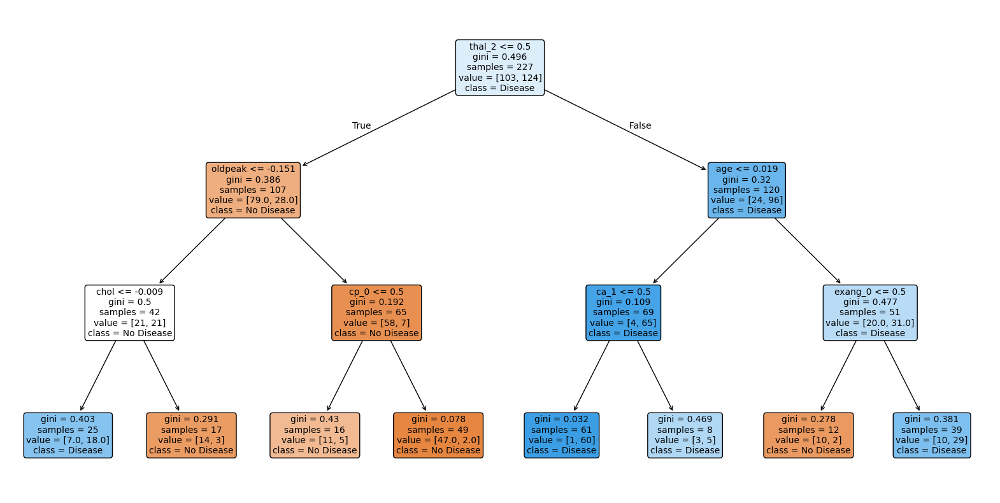

In [9]:
# 2) Decision Tree (shallow for interpretability)
tree = Pipeline([
    ("prep", preprocess),
    ("clf", DecisionTreeClassifier(max_depth=3, random_state=0))
])

tree.fit(X_train, y_train)
proba_tree = tree.predict_proba(X_test)[:, 1]
pred_tree = (proba_tree >= 0.5).astype(int)

print("Tree    accuracy:", accuracy_score(y_test, pred_tree))
print("Tree    ROC AUC :", roc_auc_score(y_test, proba_tree))

plt.figure(figsize=(20, 10))
plot_tree(
    tree.named_steps["clf"],
    feature_names=all_feature_names,
    class_names=["No Disease", "Disease"],
    filled=True,
    rounded=True,
    fontsize=10
)
plt.show()


### Random Forest and global feature importance

In this section, we train a Random Forest model, which combines predictions from many decision trees to capture more complex patterns than a single tree.

After training, we examine the model’s global feature importance scores. These scores summarize how useful each feature is across the entire ensemble when making splits, providing a high-level view of which inputs the model tends to rely on overall.


In [10]:
# 3) Random Forest (feature importance)
rf = Pipeline([
    ("prep", preprocess),
    ("clf", RandomForestClassifier(n_estimators=400, random_state=0, n_jobs=-1))
])

rf.fit(X_train, y_train)
proba_rf = rf.predict_proba(X_test)[:, 1]
pred_rf = (proba_rf >= 0.5).astype(int)

print("RF      accuracy:", accuracy_score(y_test, pred_rf))
print("RF      ROC AUC :", roc_auc_score(y_test, proba_rf))

rf_imp = pd.Series(rf.named_steps["clf"].feature_importances_, index=all_feature_names).sort_values(ascending=False)
rf_imp.head(15)


RF      accuracy: 0.8289473684210527
RF      ROC AUC : 0.8951219512195122


,0
oldpeak,0.096937
thal_3,0.082866
cp_0,0.081457
thal_2,0.079419
thalach,0.073719
age,0.071536
ca_0,0.068837
chol,0.063987
trestbps,0.056349
exang_0,0.054708


### Training a boosted tree model (XGBoost)

In this section, we train a gradient-boosted tree model using the same input features. Because this model does not natively handle categorical variables, we explicitly one-hot encode the categorical features and ensure that the training and test sets have aligned feature representations.

The boosted tree model can capture more complex patterns and interactions than simpler models. We again evaluate predictive performance on the held-out test set.


In [11]:
# One-hot encode for XGBoost
X_train_ohe = pd.get_dummies(X_train.astype({c:"category" for c in categorical}), columns=categorical, drop_first=False)
X_test_ohe  = pd.get_dummies(X_test.astype({c:"category" for c in categorical}),  columns=categorical, drop_first=False)

# Align columns between train/test
X_train_ohe, X_test_ohe = X_train_ohe.align(X_test_ohe, join="left", axis=1, fill_value=0)

xgb_clf = xgb.XGBClassifier(
    n_estimators=600,
    max_depth=3,
    learning_rate=0.05,
    subsample=0.9,
    colsample_bytree=0.9,
    reg_lambda=1.0,
    random_state=0,
    eval_metric="logloss",
)

xgb_clf.fit(X_train_ohe, y_train)

proba_xgb = xgb_clf.predict_proba(X_test_ohe)[:, 1]
pred_xgb = (proba_xgb >= 0.5).astype(int)

print("XGB     accuracy:", accuracy_score(y_test, pred_xgb))
print("XGB     ROC AUC :", roc_auc_score(y_test, proba_xgb))


XGB     accuracy: 0.8026315789473685
XGB     ROC AUC : 0.8878048780487805


### Global explanations using SHAP for a boosted tree model

In this section, we use a SHAP-based explanation method designed specifically for tree-based models. SHAP provides a way to attribute parts of a model’s prediction to individual features in a consistent framework.

We first compute SHAP values for the test set, which quantify how each feature contributes to the model’s output relative to a baseline. We then visualize these values using a global summary plot. This plot aggregates information across many test examples and provides a model-level view of which features tend to influence predictions and how their effects vary.


In [12]:
# TreeSHAP-style contributions via XGBoost
dm_test = xgb.DMatrix(X_test_ohe, feature_names=list(X_test_ohe.columns))
contrib = xgb_clf.get_booster().predict(dm_test, pred_contribs=True)

contrib_df = pd.DataFrame(contrib, columns=list(X_test_ohe.columns) + ["bias"])


/tmp/ipython-input-1668295432.py:10: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


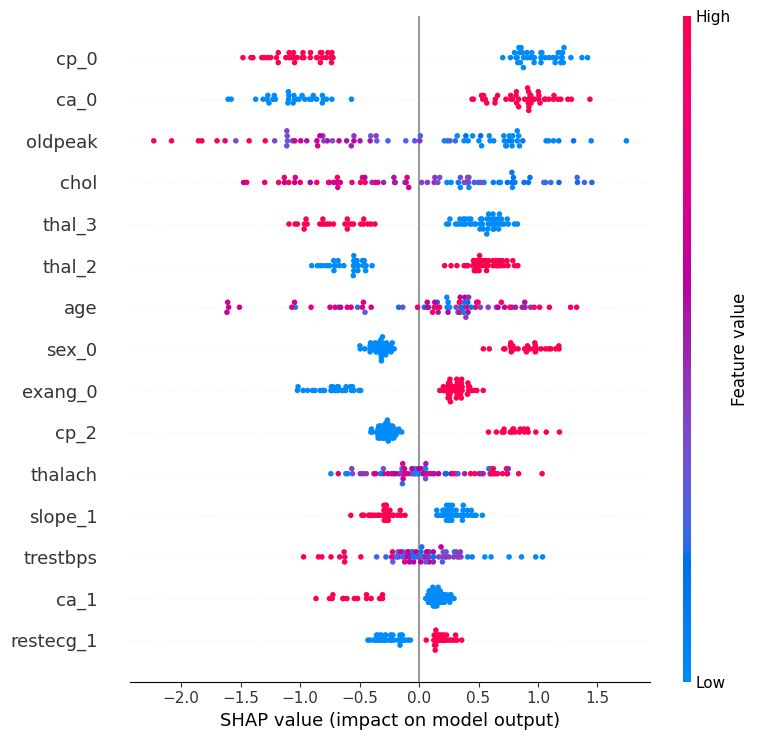

In [13]:
import shap

# Create SHAP explainer for tree-based model
explainer = shap.TreeExplainer(xgb_clf)

# Compute SHAP values
shap_values = explainer.shap_values(X_test_ohe)

# Global summary plot
shap.summary_plot(
    shap_values,
    X_test_ohe,
    max_display=15
)


### Local explanation for a single test example

In this section, we focus on one specific test example and examine how the trained XGBoost model arrived at its prediction for that case.

We display the raw feature values for the selected example, along with the model’s predicted probability. We then organize the feature-level contributions by their magnitude, highlighting which features had the largest influence on the model’s output for this individual input.


In [14]:
# Explain ONE test example (local contributions)
i = 0
x_row = X_test.iloc[i]
y_true = int(y_test.iloc[i])
p = float(proba_xgb[i])

row_contrib = contrib_df.iloc[i].drop("bias").sort_values(key=np.abs, ascending=False)
bias = float(contrib_df.iloc[i]["bias"])

print("Example index:", X_test.index[i])
print("Features (raw patient record):")
display(x_row.to_frame("value"))

print("\nTrue label   :", y_true)
print("Pred prob    :", p)
print("Bias term    :", bias)
print("\nTop contributions (by |value|):")
row_contrib.head(12)


Example index: 24
Features (raw patient record):


,value
age,40.0
sex,1.0
cp,3.0
trestbps,140.0
chol,199.0
fbs,0.0
restecg,1.0
thalach,178.0
exang,1.0
oldpeak,1.4



True label   : 1
Pred prob    : 0.6784157752990723
Bias term    : 0.1579759269952774

Top contributions (by |value|):


,0
cp_0,1.417076
thal_3,-1.042744
ca_0,0.941450
oldpeak,-0.809834
chol,0.780903
thal_2,-0.718542
age,-0.678030
thalach,0.643098
exang_0,-0.614038
slope_1,0.479193


---

## Part B — Image explainability (Rio photo)

### Loading and displaying an example image

In this section, we load an example image that will be used to study interpretability for image-based models. We also load the corresponding scene category labels associated with the pretrained model.

The image is displayed in its raw form so that we have a clear reference point before applying any model predictions or explanation methods.


(np.float64(-0.5), np.float64(799.5), np.float64(599.5), np.float64(-0.5))

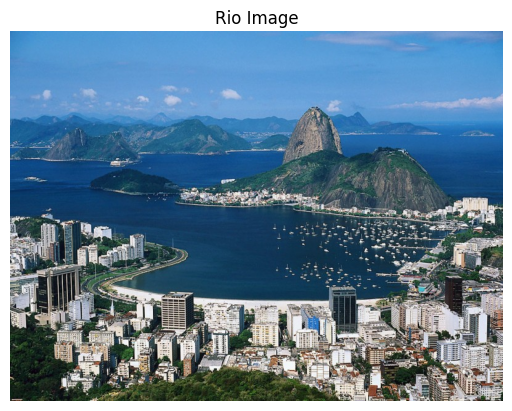

In [15]:
import torch
from torchvision import models, transforms
import numpy as np
import matplotlib.pyplot as plt
import PIL.Image
import cv2
import requests
from io import BytesIO

from urllib.request import urlopen

synset_url = 'http://gandissect.csail.mit.edu/models/categories_places365.txt'
classlabels = [
    r.split(' ')[0][3:] for r in urlopen(synset_url).read().decode('utf-8').split('\n')
]

url = 'http://6.869.csail.mit.edu/fa19/miniplaces_part1/rio.jpg'
response = requests.get(url)
img_pil = PIL.Image.open(BytesIO(response.content)).convert("RGB")
# Downscale explicitly to match ResNet input size
# img_resized = img_pil.resize((224, 224))

# Convert to numpy for visualization
img_np = np.array(img_pil)

plt.imshow(img_np)
plt.title("Rio Image")
plt.axis("off")


### Loading a pretrained image classification model

In this section, we load a pretrained convolutional neural network that was trained on the Places365 dataset, which contains a large number of scene categories.

We download the pretrained weights, initialize the model architecture, and load the parameters into the network. The model is then placed in evaluation mode to ensure consistent behavior during inference and interpretability analysis.

At this stage, the model is treated as a fixed black box: we will use it to generate predictions and explanations without modifying its parameters.


In [19]:
import urllib.request

url = "http://places2.csail.mit.edu/models_places365/resnet50_places365.pth.tar"

# ----------------------------
# Path to downloaded weights
# ----------------------------
weights_path = "resnet50_places365.pth.tar"


urllib.request.urlretrieve(url, weights_path)
print("Downloaded places365 ResNet50")


Downloaded places365 ResNet50


In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Initialize model
resnet = models.resnet50(num_classes=365)
resnet = resnet.to(device)

# Load checkpoint
checkpoint = torch.load(weights_path, map_location=device)
sd = checkpoint["state_dict"]

# Remove 'module.' prefix if present
sd = {k.replace("module.", ""): v for k, v in sd.items()}

# Load weights
resnet.load_state_dict(sd)

# Evaluation mode (important!)
resnet.eval()


Using device: cuda


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

### Preprocessing the image and generating model predictions

Before passing the image to the neural network, we preprocess it to match the format and scale expected by the pretrained model. This includes resizing, converting the image to a tensor, and normalizing pixel values using dataset-specific statistics.

Once preprocessed, the image is passed through the model to obtain class scores. We then identify the top predicted categories based on these scores. These predictions will be used as reference points for the interpretability analyses that follow.


In [21]:
# data preprocessing: resize an image, change it from a PIL image to a pytorch tensor, normalize it according to dataset statistics
center_crop = transforms.Compose(
    [
        transforms.Resize((227, 227)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ]
)

# our model can only take input that is preprocessed, so preprocess our loaded image
img_tensor = center_crop(img_pil).to(device)
logits = resnet(img_tensor.unsqueeze(0)).squeeze()
# get the indices associated with the topk logits
categories = logits.topk(5)[1]

# print the labels corresponding to the topk indices
print(categories)
print(', '.join([classlabels[cat] for cat in categories]))


tensor([348, 194,  49,  97, 171], device='cuda:0')
village, islet, beach_house, coast, harbor


### Defining a Grad-CAM function for image explanations

In this section, we define a function to compute Grad-CAM visualizations for image classification models. Grad-CAM is a gradient-based method that highlights spatial regions of an image that are most influential for a specific class prediction.

The method works by:
- Recording activations from a chosen convolutional layer during the forward pass
- Computing gradients of the class score with respect to those activations
- Combining the two to produce a coarse, class-specific heatmap

We implement Grad-CAM using forward and backward hooks, allowing us to capture the necessary intermediate values without modifying the model itself.

In [22]:
import numpy as np
import torch

gradients = []
activations = []

def forward_hook(module, inp, out):
    activations.append(out)

def backward_hook(module, grad_input, grad_output):
    # grad_output is a tuple; take gradient w.r.t. module output
    gradients.append(grad_output[0])

def grad_cam(model, img_tensor, class_idx, target_layer=None):
    model.eval()
    gradients.clear()
    activations.clear()

    # Ensure batched input: (1,3,H,W)
    if img_tensor.ndim == 3:
        img_tensor = img_tensor.unsqueeze(0)

    # Pick a sensible default layer if not given
    if target_layer is None:
        # last residual block is a good default for ResNet
        target_layer = model.layer4[-1]

    # Register hooks
    fwd = target_layer.register_forward_hook(forward_hook)
    bwd = target_layer.register_full_backward_hook(backward_hook)

    try:
        output = model(img_tensor)
        score = output[0, class_idx]

        model.zero_grad(set_to_none=True)
        score.backward(retain_graph=False)

        # activations/grads: (1, C, H, W)
        acts = activations[-1].detach()[0]   # (C, H, W)
        grads = gradients[-1].detach()[0]    # (C, H, W)

        # Channel weights: global-average-pool the gradients
        weights = grads.mean(dim=(1, 2))     # (C,)

        # Weighted sum of activations
        cam = (weights[:, None, None] * acts).sum(dim=0)  # (H, W)
        cam = torch.relu(cam)

        # Normalize safely to [0, 1]
        cam_max = cam.max()
        if cam_max > 0:
            cam = cam / cam_max

        return cam.cpu().numpy().astype(np.float32)

    finally:
        # Always remove hooks
        fwd.remove()
        bwd.remove()


### Visualizing Grad-CAM explanations for multiple predicted classes

In this section, we apply the Grad-CAM function to the same image for several different predicted classes. For each class, we generate a class-specific activation map and overlay it on the original image.

By holding the input image fixed and varying only the target class, we can observe how the model’s internal focus changes depending on which prediction is being evaluated.


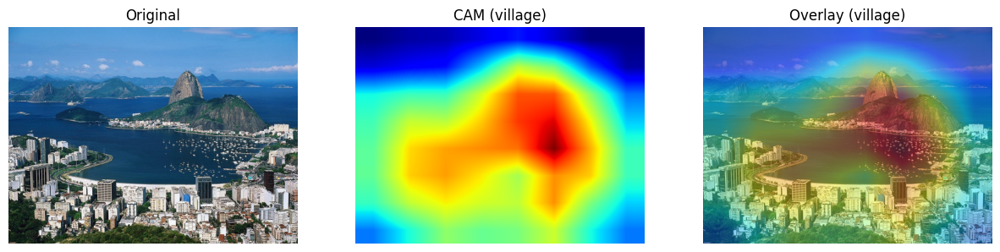

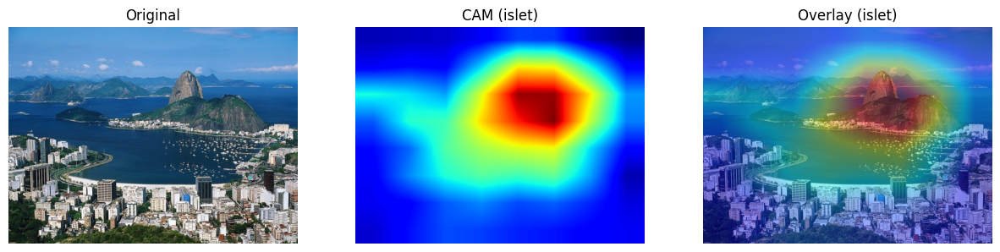

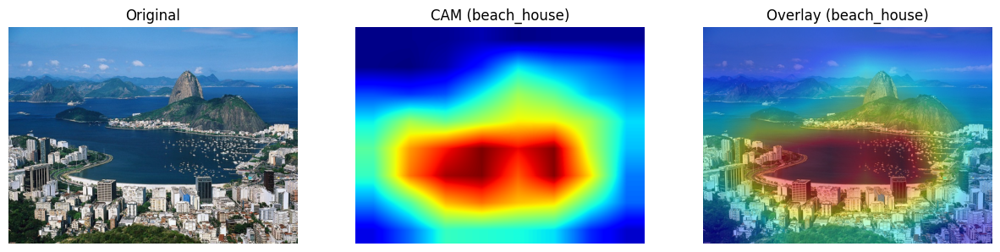

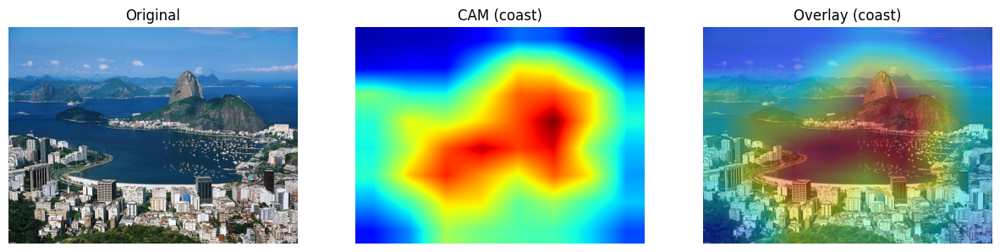

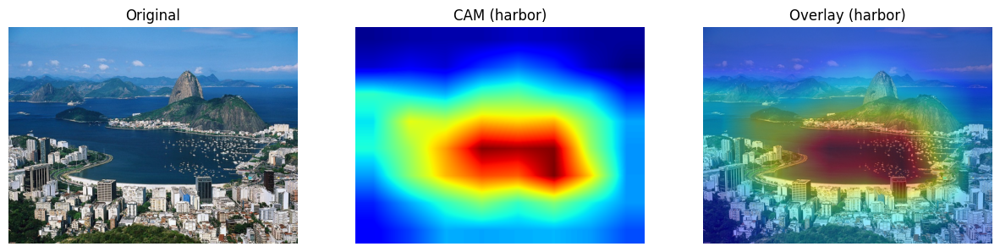

In [23]:
for i in range(5):
  pred_class = categories[i]
  cam = grad_cam(resnet, img_tensor, pred_class)  # cam is (Hcam, Wcam) in [0,1]
  cam_resized = cv2.resize(cam, (img_np.shape[1], img_np.shape[0]))

  heatmap = cv2.applyColorMap((cam_resized*255).astype(np.uint8), cv2.COLORMAP_JET)
  heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
  overlay = (0.6*img_np + 0.4*heatmap).astype(np.uint8)

  plt.figure(figsize=(15,5))
  plt.subplot(1,3,1); plt.imshow(img_np); plt.axis("off"); plt.title("Original")
  plt.subplot(1,3,2); plt.imshow(cam_resized,cmap="jet"); plt.axis("off"); plt.title(f"CAM ({classlabels[pred_class]})")
  plt.subplot(1,3,3); plt.imshow(overlay); plt.axis("off"); plt.title(f"Overlay ({classlabels[pred_class]})")

  plt.show()


---

## Part C — Text explainability (with LIME-style explanation)

### Loading a pretrained text classification model and setting up LIME

In this section, we load a pretrained language model designed for spam detection in email-like text. The model produces probabilistic predictions over the possible classes for a given input sentence.

We also initialize a LIME text explainer, which will later be used to generate local, word-level explanations for individual predictions. To enable LIME, we define a prediction function that takes raw text as input and returns class probabilities from the model.




In [51]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch, torch.nn.functional as F
from lime.lime_text import LimeTextExplainer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_name = "dima806/email-spam-detection-roberta"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name).to(device).eval()

print(model.config.id2label)  # sanity check label order

explainer = LimeTextExplainer(class_names=["ham","spam"])  # adjust if id2label differs

def predict_proba_text(texts):
    toks = tokenizer(texts, padding=True, truncation=True, max_length=256, return_tensors="pt").to(device)
    with torch.no_grad():
        logits = model(**toks).logits
    return F.softmax(logits, dim=1).cpu().numpy()


config.json:   0%|          | 0.00/796 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

{0: 'No spam', 1: 'Spam'}


### Local text explanations with LIME

In this section, we examine how a trained spam classifier explains **individual text predictions** using LIME.

We evaluate a small set of short messages that range from clearly benign to borderline or spam-like. For each message, we:
1. Compute the model’s predicted probabilities for the ham and spam classes.
2. Use LIME to generate a **local explanation** for the spam class.
3. Visualize which words most influenced the model’s prediction for that specific sentence.

#### Reminder: What does LIME do?
LIME (Local Interpretable Model-agnostic Explanations) explains a **single prediction at a time** by perturbing the input (e.g., removing or masking words) and observing how the model’s output changes. It then fits a simple, interpretable model that approximates the classifier’s behavior around that particular sentence, based on how the prediction changes when words are added, removed, or altered.

Key points to keep in mind:
- LIME explanations are **local**, not global.
- They reflect how the model behaved for *this sentence*, not how it behaves in general.
- Highlighted words indicate **influence on the prediction**, not causality or real-world intent.

As you inspect the explanations, focus on how different linguistic cues contribute to the model’s decision in each case.


In [52]:
from lime.lime_text import LimeTextExplainer

texts = [
    # likely ham
    "Hi Alex, are we still on for our meeting tomorrow at 10? No rush—just confirming.",
    "Thanks for your purchase. If anything looks incorrect, reply to this email and we’ll help.",

    # borderline
    "Security notice: unusual sign-in activity detected. Please review to keep your account active.",
    "Delivery update: we couldn’t complete delivery. Confirm your address to avoid a return. Ref: 49281.",

    # more likely spam but not cartoonish
    "You qualify for a $25 voucher based on recent activity—reply YES to receive details. Reply STOP to opt out."
]



for i, sentence in enumerate(texts):
    print("="*80)
    print(f"Sentence {i+1}:")
    print(sentence)

    probs = predict_proba_text([sentence])[0]
    print(f"P(ham)  = {probs[0]:.3f}")
    print(f"P(spam) = {probs[1]:.3f}")

    exp = explainer.explain_instance(
        sentence,
        predict_proba_text,
        num_features=8,
        labels=[1]   # explain spam class
    )

    exp.show_in_notebook(text=True)



Sentence 1:
Hi Alex, are we still on for our meeting tomorrow at 10? No rush—just confirming.
P(ham)  = 1.000
P(spam) = 0.000


Sentence 2:
Thanks for your purchase. If anything looks incorrect, reply to this email and we’ll help.
P(ham)  = 0.020
P(spam) = 0.980


Sentence 3:
Security notice: unusual sign-in activity detected. Please review to keep your account active.
P(ham)  = 0.006
P(spam) = 0.994


Sentence 4:
Delivery update: we couldn’t complete delivery. Confirm your address to avoid a return. Ref: 49281.
P(ham)  = 0.995
P(spam) = 0.005


Sentence 5:
You qualify for a $25 voucher based on recent activity—reply YES to receive details. Reply STOP to opt out.
P(ham)  = 0.007
P(spam) = 0.993


Throughout this notebook, you explored how different models and explanation tools provide insight into predictions across tabular, image, and text data. Each method highlights certain aspects of model behavior while leaving others opaque. Some explanations summarize patterns across many inputs, while others focus on a single decision. Understanding what question an explanation answers—and what it does not answer—is essential for using interpretability responsibly.